# Figure faces

In this notebook we'll generate all figures on face shape
- Figure 3: differences on sexual dimorphism across populations

In [1]:
#Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
from Faces import *
from matplotlib.offsetbox import (TextArea, DrawingArea, OffsetImage,
                                  AnnotationBbox)

In [2]:
#Folders
thispath      = os.getcwd()
projpath      = os.path.realpath("../..")
pathres       = os.path.join(projpath, "Results")
pathlandmarks = os.path.join(projpath, "Results", "Landmarks")
pathfacepca   = os.path.join(projpath, "DataBases", "FacePCA")
pathfig       = os.path.join(projpath, "Results", "Figures")

In [3]:
#Databases
os.chdir(pathfacepca)
facets = pd.read_csv("facets.csv", header = None)
os.chdir(pathlandmarks)
landmark_set = np.matrix(pd.read_csv("sex_decomp_landmarks.csv", header = None))
landmark_sex_avg = np.matrix(pd.read_csv("sex_vector_average.csv", header = None))
sex_landmarks = np.matrix(pd.read_csv("sex_landmarks.csv", header = None))
os.chdir(pathres)
dat = pd.read_csv("tot_samples.csv")

In [4]:
from patsy import dmatrices, dmatrix
from numpy.linalg import inv

Y = dat.iloc[:,6:19]
X = dat.iloc[:, list(range(1,6)) +  [20]]
X['cluster_final'][X['cluster_final'] == 1] = 'A'
X['cluster_final'][X['cluster_final'] == 2] = 'B'
X['cluster_final'][X['cluster_final'] == 3] = 'C'

X_scaled = X[['Age', 'Height', 'BMI']]
X_scaled = (X_scaled - X_scaled.mean())/ X_scaled.std()
X_scaled
X[['Age', 'Height', 'BMI']] = X_scaled

X
d_mat = dmatrix('Age + Height + BMI + Sex * cluster_final', X)
np_d_mat = np.array(d_mat)

coeffs = inv(np_d_mat.transpose().dot(np_d_mat)).dot(np_d_mat.transpose()).dot(np.array(Y) )

/home/tomas/anaconda3/envs/py/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/tomas/anaconda3/envs/py/lib/python3.6/site-packages/pandas/core/generic.py:8682: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
/home/tomas/anaconda3/envs/py/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3326: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  exec(code_obj, self.user_global_ns, self.user_ns)
/ho

In [5]:
x_ls = np.array([[1,0,0,0,0,0,0,0,0], [1,1,0,0,0,0,0,0,0], 
                 [1,0,1,0,0,0,0,0,0], [1,1,1,0,1,0,0,0,0], 
                 [1,0,0,1,0,0,0,0,0], [1,1,0,1,0,1,0,0,0]])
obs_ls = x_ls.dot(coeffs)
pd.DataFrame(obs_ls)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.012069,-0.013235,-0.014443,0.009683,0.009118,-0.004449,0.003859,0.005865,0.001090,0.003533,0.002115,-0.001126,-0.001395
1,0.003947,0.006351,-0.024046,0.001268,0.009426,-0.002713,-0.000886,0.011282,0.003074,0.000616,-0.000150,-0.001464,0.000656
2,0.002266,-0.004446,0.005522,0.000361,-0.002666,0.000040,0.002346,-0.001968,-0.001930,-0.000197,-0.000580,-0.000267,-0.000375
3,-0.011675,0.017035,-0.002803,-0.002543,-0.001830,0.001212,-0.003316,0.000149,0.002935,-0.000599,0.000739,0.000939,0.000874
4,0.024337,-0.045406,0.003231,-0.009697,0.019016,0.003879,-0.012112,-0.000964,-0.001513,-0.001143,-0.001875,0.000525,0.000415
5,0.017914,-0.025365,0.001410,-0.005620,0.016405,0.001290,-0.018422,0.004310,0.000477,-0.001641,-0.001986,0.001175,0.002264


In [6]:
#Define some functions
def scatter_gm(x, y, group, ax, xlim = [-0.1, 0.1], ylim = [-0.1, 0.1], means = (0,0,0,0) ):
    '''
    Generate geometric morphometrics like scatter plot, with axes going through the origin using different colors for groups.
    This function generates an ax object, make sure to have your figure (fig) object already called
    Usage
        Input:
            - x: values to be plotted in the x coordinates
            - y: values to be plotted in the y coordinates
            - group: grouping variable to be maped on the scatter plot
            - ax: ax from matplotlib
            - xlim: the limits of x axis
            - ylim: the limits of y axis
            - means: the values to highlight in the plot (females first)
    '''
    #Importing required libraries
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    color = group.map(color_map)
    al = 0.5
    ax.scatter(x, y, alpha=al, c=color )
    
    if means == (0,0,0,0):
        al = 0.5
    else:
        al = 0.3
        mean_female = means[0:2]
        mean_male   = means[2:4]
        ax.scatter(mean_female[0], mean_female[1], c = color_map['Female'], s=120, edgecolors='black' )
        ax.scatter(mean_male[0], mean_male[1], c = color_map['Male'], s=120, edgecolors='black' )

    
    ax.set_xlim(xlim)
    ax.set_ylim(ylim) 
    plt.axis('off')
    ax.plot((0,0), ylim, 'k-')
    ax.plot(xlim, (0,0), 'k-')        
            
def paste_screenshot(face, ax, pos = (0,0)):
    img   = face.take_screenshot()
    image = OffsetImage(img, zoom=0.05)
    ab = AnnotationBbox(image, pos, xycoords='data', frameon=False)
    ax.add_artist(ab)

In [7]:
#Creating tree
from ete3 import Tree, TreeStyle, NodeStyle, TextFace, faces
tree = Tree("(A, (B, C));")
tree.force_topology = True

ts = TreeStyle()
#Rotating, removing scale and general tree settings
ts.show_leaf_name = True
ts.show_scale = False
ts.branch_vertical_margin = 400
ts.rotation = 0

#Remove node points for all, widen lines, and color them gray
for n in tree.traverse():
    style = NodeStyle()
    style["vt_line_width"] = 6
    style["hz_line_width"] = 6
    style["size"]  = 0
        
    n.img_style = style

#Color leaves based on leaf
for leaf in tree.iter_leaves():
    style = NodeStyle()
    style["size"] = 20
    style["vt_line_width"] = 6
    style["hz_line_width"] = 6
    leaf.img_style = style

    
os.chdir(pathfig)
tree.render("Tree2.png", dpi=300, tree_style=ts, h = 5000, w = 1000)
; #to hide the output
#tree.show()

'#to hide the output'

In [7]:
#Read plot images
import matplotlib.image as mpimg
os.chdir(pathfig)
tree_img  = mpimg.imread('Tree2.png')

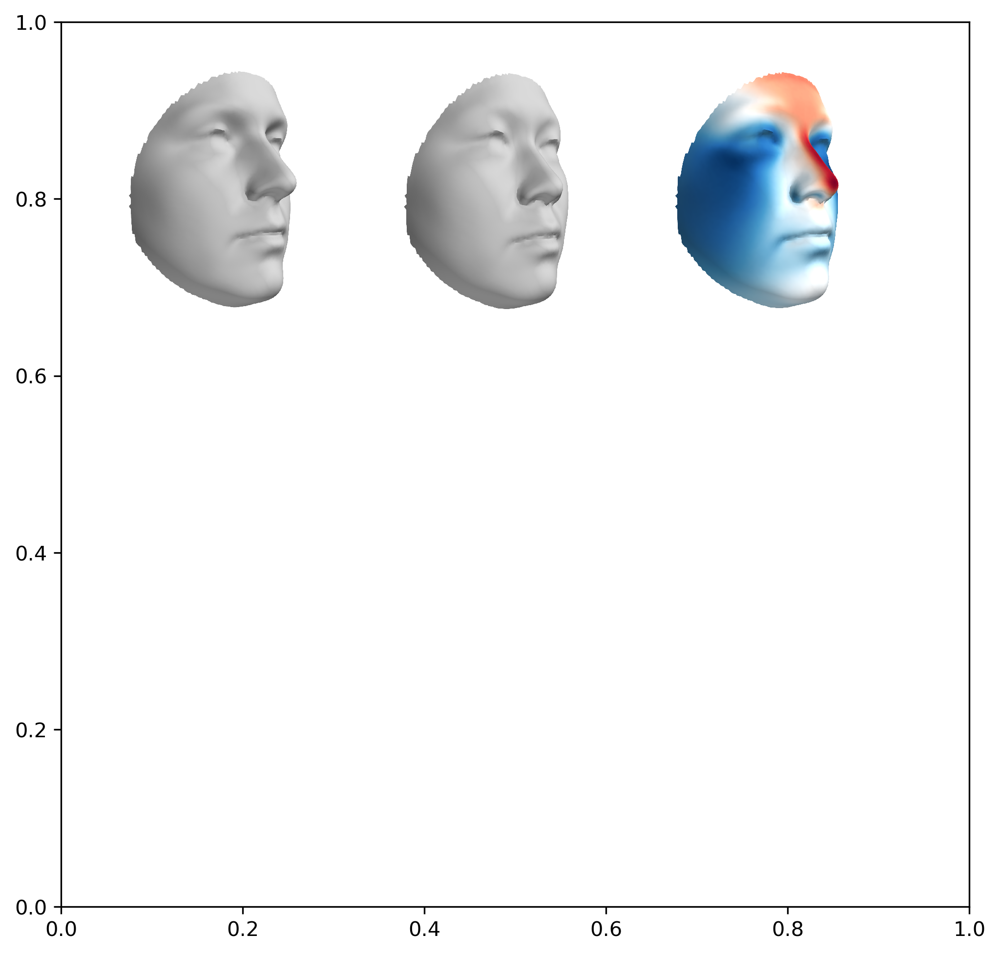

In [18]:
#pos_face = range(2, nrow, 6)

fig = plt.figure(figsize=(8, 8), dpi=300)
ax  = fig.add_subplot(111)

face1 = FaceShape( ( sex_landmarks[2,] + sex_landmarks[3,] ) / 2, facets)
face2 = FaceShape( ( sex_landmarks[4,] + sex_landmarks[5,] ) / 2, facets)
img1 = face1.take_screenshot(profile=1)
img2 = face2.take_screenshot(profile=1)
nor_disp  = face1.get_normal_displacement(face2)
avg   = (face1.landmarks + face2.landmarks) / 2
avgface = FaceShape(avg, facets)
img3 = avgface.take_screenshot(colormap=nor_disp, profile=1, colortype='RdBu')
image1 = OffsetImage(img1, zoom=0.1)
image2 = OffsetImage(img2, zoom=0.1)
image3 = OffsetImage(img3, zoom=0.1)
a1 = AnnotationBbox(image1, (0.20, 0.8), xycoords='data', frameon=False)
a2 = AnnotationBbox(image2, (0.50, 0.8), xycoords='data', frameon=False)
a3 = AnnotationBbox(image3, (0.80, 0.8), xycoords='data', frameon=False)
ax.add_artist(a1)
ax.add_artist(a2)
ax.add_artist(a3)

plt.show()

In [ ]:
face1 = FaceShape(diff_f, facets)
face2 = FaceShape(diff_m, facets)
img1 = face1.take_screenshot(profile=1)
img2 = face2.take_screenshot(profile=1)
nor_disp  = face1.get_normal_displacement(face2)
avg   = (face1.landmarks + face2.landmarks) / 2
avgface = FaceShape(avg, facets)
img3 = avgface.take_screenshot(colormap=nor_disp, profile=1, colortype='RdBu')
image1 = OffsetImage(img1)
image2 = OffsetImage(img2)
image3 = OffsetImage(img3)
a1 = AnnotationBbox(image1, (0.20, 0.5), xycoords='data', frameon=False)
a2 = AnnotationBbox(image2, (0.50, 0.5), xycoords='data', frameon=False)
a3 = AnnotationBbox(image3, (0.80, 0.5), xycoords='data', frameon=False)
ax.add_artist(a1)
ax.add_artist(a2)
ax.add_artist(a3)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

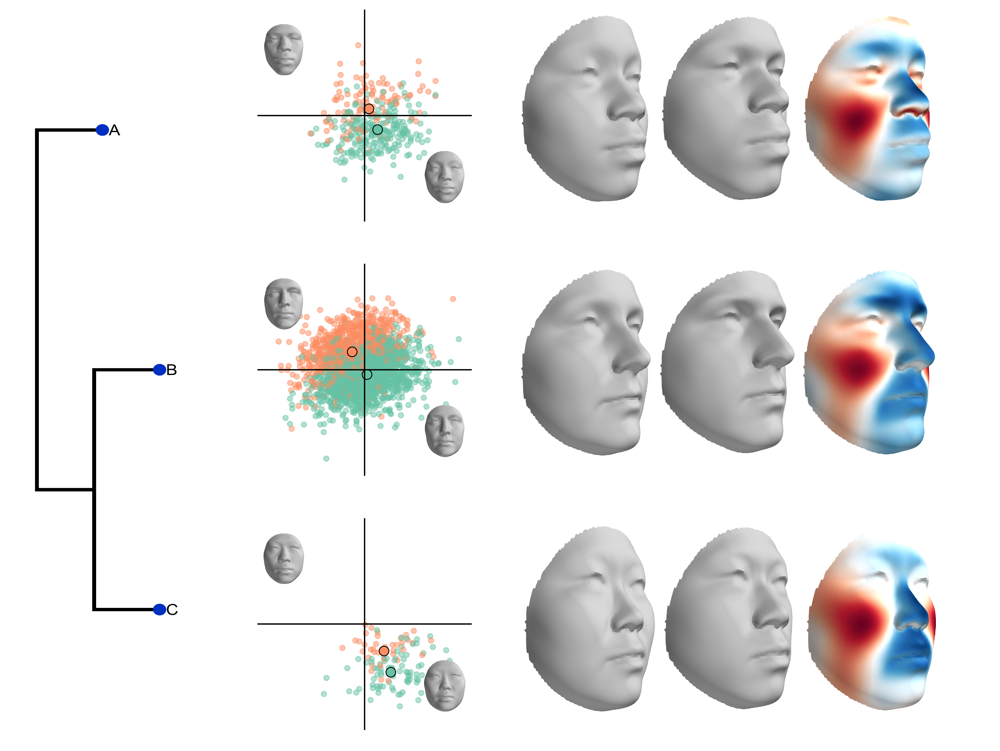

In [9]:
#TEsting here
import seaborn as sns
nrow = landmark_set.shape[0]
color_labels = dat['Sex'].unique()
rgb_values   = sns.color_palette('Set2', 2)
color_map    = dict(zip(color_labels, rgb_values))
fig = plt.figure(figsize=(20, 15), dpi=300)
gs  = gridspec.GridSpec(3, 4)

#Paste tree
ax = fig.add_subplot(gs[:,0])

#Generate axes
ax.imshow(tree_img)
ax.axis('off')


count = 0
pos   = 0
pos_face = range(2, nrow, 6)
for i in range(1,4):
    ax   = fig.add_subplot(gs[pos,1])
    keep = dat['cluster_final'] == i
    
    scatter_gm(dat['PC1'][keep], dat['PC2'][keep], dat['Sex'][keep], ax, 
               means=(obs_ls[count][0],obs_ls[count][1],obs_ls[count+1][0],obs_ls[count+1][1]))
    
    face1 = FaceShape(landmark_set[pos_face[pos]], facets)
    face2 = FaceShape(landmark_set[pos_face[pos]+1], facets)
    
    paste_screenshot(face1, ax, (0.075, -0.06) )
    paste_screenshot(face2, ax, (-0.075, 0.06) )
    
    pos   = pos + 1
    count = count + 2


pos = 0
for i in range(2, nrow, 6):
    ax    = fig.add_subplot(gs[pos,2:])
    face1 = FaceShape(landmark_set[i], facets)
    face2 = FaceShape(landmark_set[i + 1], facets)
    img1 = face1.take_screenshot(profile=1)
    img2 = face2.take_screenshot(profile=1)
    nor_disp  = face1.get_normal_displacement(face2)
    avg   = (face1.landmarks + face2.landmarks) / 2
    avgface = FaceShape(avg, facets)
    img3 = avgface.take_screenshot(colormap=nor_disp, profile=1, colortype='RdBu')
    
    image1 = OffsetImage(img1, zoom=0.18)
    image2 = OffsetImage(img2, zoom=0.18)
    image3 = OffsetImage(img3, zoom=0.18)
    
    a1 = AnnotationBbox(image1, (0.20, 0.5), xycoords='data', frameon=False)
    a2 = AnnotationBbox(image2, (0.50, 0.5), xycoords='data', frameon=False)
    a3 = AnnotationBbox(image3, (0.80, 0.5), xycoords='data', frameon=False)
    
    ax.add_artist(a1)
    ax.add_artist(a2)
    ax.add_artist(a3)
    pos = pos + 1
    plt.axis('off')
        
plt.savefig('Figure4.png', dpi=300, bbox_inches='tight')
plt.show()


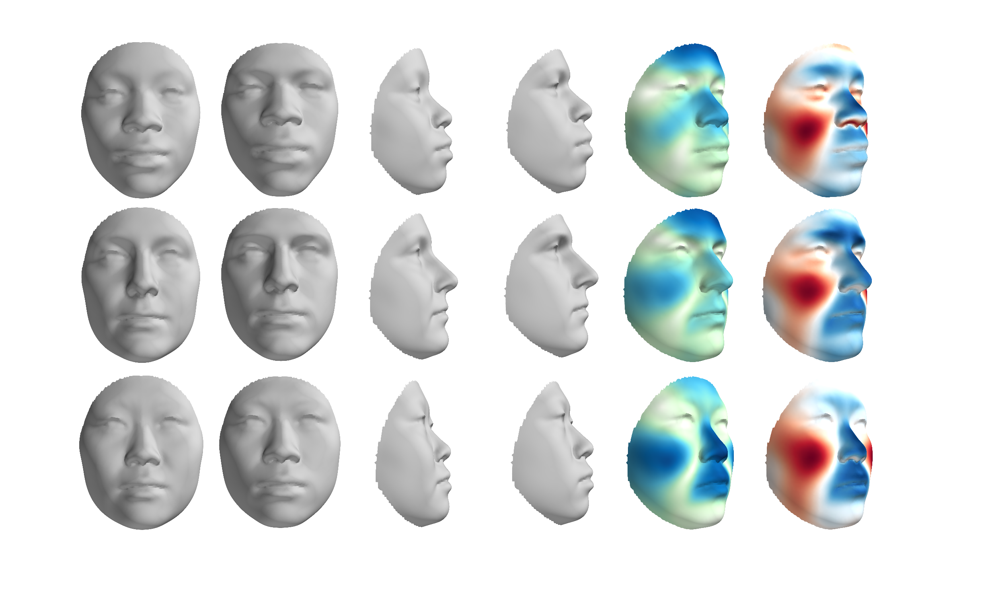

In [10]:
#Plot set of faces
nrow = landmark_set.shape[0]
fig = plt.figure(figsize=(10, 6), dpi=300)
ax  = fig.add_subplot(111)
ax.set_ylim([0.25,1])
ax.set_xlim([0,1])
plt.axis('off')

crow = 0.85
#Plot non-allometric sex dimorphism
for i in range(2, nrow, 6):
    face1 = FaceShape(landmark_set[i], facets)
    face2 = FaceShape(landmark_set[i + 1], facets)
    img1 = face1.take_screenshot(profile=0)
    img2 = face2.take_screenshot(profile=0)
    img3 = face1.take_screenshot(profile=2)
    img4 = face2.take_screenshot(profile=2)
    euc_dist  = face1.get_euc_dist(face2)
    nor_disp  = face1.get_normal_displacement(face2)
    avg   = (face1.landmarks + face2.landmarks) / 2
    avgface = FaceShape(avg, facets)
    img5 = avgface.take_screenshot(colormap=euc_dist, profile=1, colortype='GnBu')
    img6 = avgface.take_screenshot(colormap=nor_disp, profile=1, colortype='RdBu')
    
    image1 = OffsetImage(img1, zoom=0.08)
    image2 = OffsetImage(img2, zoom=0.08)
    image3 = OffsetImage(img3, zoom=0.08)
    image4 = OffsetImage(img4, zoom=0.08)
    image5 = OffsetImage(img5, zoom=0.08)
    image6 = OffsetImage(img6, zoom=0.08)
    
    a1 = AnnotationBbox(image1, (0.10, crow), xycoords='data', frameon=False)
    a2 = AnnotationBbox(image2, (0.25, crow), xycoords='data', frameon=False)
    a3 = AnnotationBbox(image3, (0.40, crow), xycoords='data', frameon=False)
    a4 = AnnotationBbox(image4, (0.55, crow), xycoords='data', frameon=False)
    a5 = AnnotationBbox(image5, (0.70, crow), xycoords='data', frameon=False)
    a6 = AnnotationBbox(image6, (0.85, crow), xycoords='data', frameon=False)
    
    ax.add_artist(a1)
    ax.add_artist(a2)
    ax.add_artist(a3)
    ax.add_artist(a4)
    ax.add_artist(a5)
    ax.add_artist(a6)
    
    crow = crow - 0.23
    
os.chdir(pathfig)
plt.savefig('FigureS2.png', dpi=300, bbox_inches='tight')
plt.show()

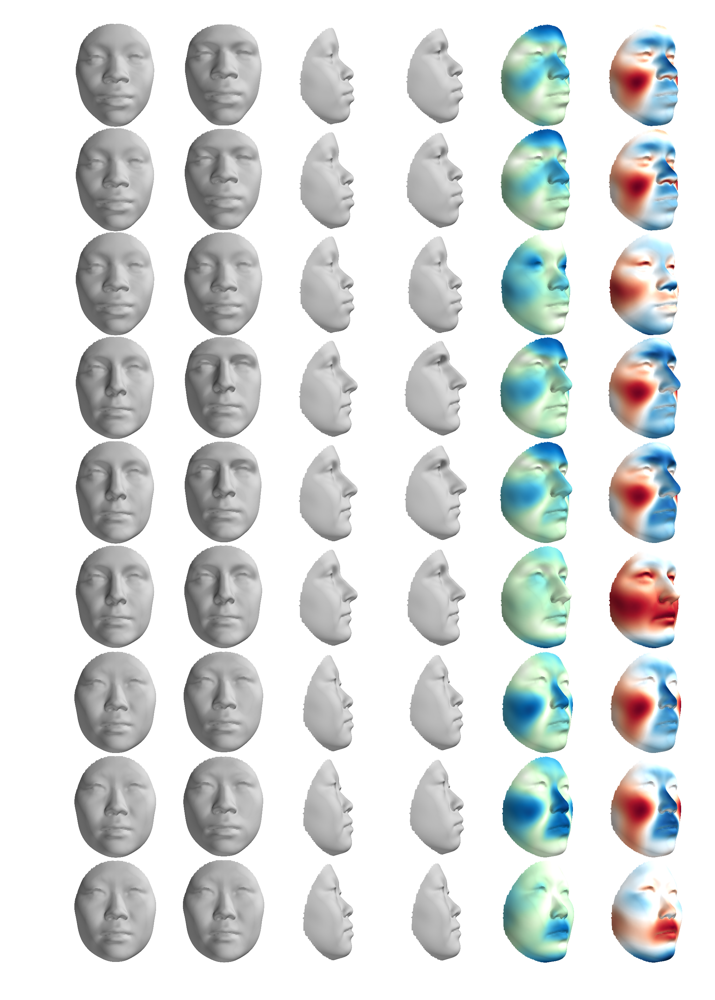

In [11]:
#Plot set of faces
fig = plt.figure(figsize=(8, 12), dpi=300)
ax  = fig.add_subplot(111)
ax.set_ylim([0,3])
ax.set_xlim([0,0.9])
plt.axis('off')

crow = 2.8
for i in range(0,18,2):
    index = 0
    face1 = FaceShape(landmark_set[i], facets)
    face2 = FaceShape(landmark_set[i + 1], facets)
    img1 = face1.take_screenshot(profile=0)
    img2 = face2.take_screenshot(profile=0)
    img3 = face1.take_screenshot(profile=2)
    img4 = face2.take_screenshot(profile=2)
    euc_dist  = face1.get_euc_dist(face2)
    nor_disp  = face1.get_normal_displacement(face2)
    avg   = (face1.landmarks + face2.landmarks) / 2
    avgface = FaceShape(avg, facets)
    img5 = avgface.take_screenshot(colormap=euc_dist, profile=1, colortype='GnBu')
    img6 = avgface.take_screenshot(colormap=nor_disp, profile=1, colortype='RdBu')
    
    image1 = OffsetImage(img1, zoom=0.06)
    image2 = OffsetImage(img2, zoom=0.06)
    image3 = OffsetImage(img3, zoom=0.06)
    image4 = OffsetImage(img4, zoom=0.06)
    image5 = OffsetImage(img5, zoom=0.06)
    image6 = OffsetImage(img6, zoom=0.06)
    
    a1 = AnnotationBbox(image1, (0.10, crow), xycoords='data', frameon=False)
    a2 = AnnotationBbox(image2, (0.25, crow), xycoords='data', frameon=False)
    a3 = AnnotationBbox(image3, (0.40, crow), xycoords='data', frameon=False)
    a4 = AnnotationBbox(image4, (0.55, crow), xycoords='data', frameon=False)
    a5 = AnnotationBbox(image5, (0.70, crow), xycoords='data', frameon=False)
    a6 = AnnotationBbox(image6, (0.85, crow), xycoords='data', frameon=False)

    
    ax.add_artist(a1)
    ax.add_artist(a2)
    ax.add_artist(a3)
    ax.add_artist(a4)
    ax.add_artist(a5)
    ax.add_artist(a6)
    
    crow = crow - 0.33
    
os.chdir(pathfig)
plt.savefig('FigureS3.png', dpi=300, bbox_inches='tight')
plt.show()

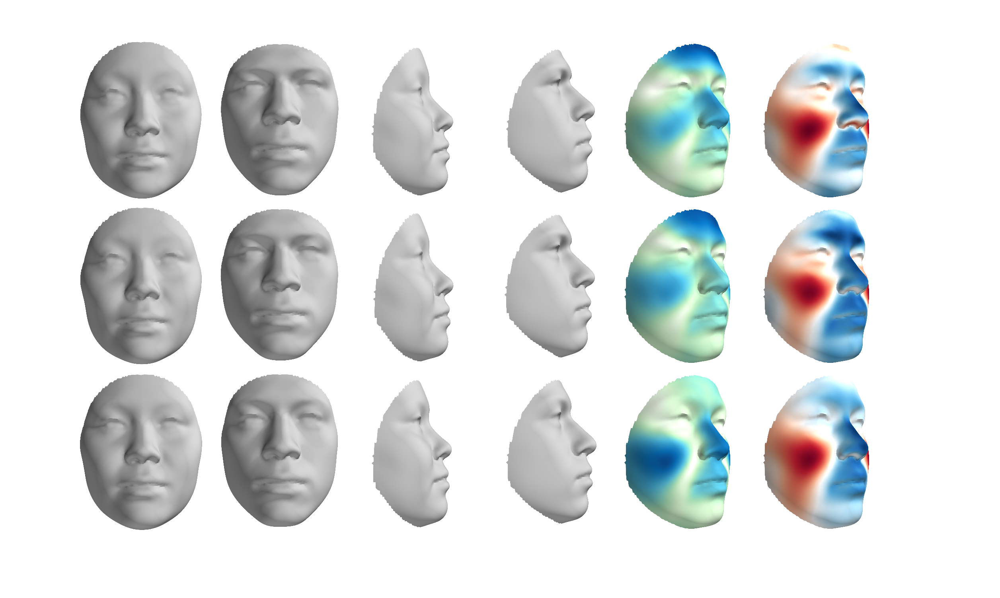

In [7]:
#Plot set of faces
nrow = landmark_sex_avg.shape[0]
fig = plt.figure(figsize=(10, 6), dpi=300)
ax  = fig.add_subplot(111)
ax.set_ylim([0.25,1])
ax.set_xlim([0,1])
plt.axis('off')

crow = 0.85
#Plot sex dimorphism
for i in range(0, nrow, 2):
    face1 = FaceShape(landmark_sex_avg[i], facets)
    face2 = FaceShape(landmark_sex_avg[i + 1], facets)
    img1 = face1.take_screenshot(profile=0)
    img2 = face2.take_screenshot(profile=0)
    img3 = face1.take_screenshot(profile=2)
    img4 = face2.take_screenshot(profile=2)
    euc_dist  = face1.get_euc_dist(face2)
    nor_disp  = face1.get_normal_displacement(face2)
    avg   = (face1.landmarks + face2.landmarks) / 2
    avgface = FaceShape(avg, facets)
    img5 = avgface.take_screenshot(colormap=euc_dist, profile=1, colortype='GnBu')
    img6 = avgface.take_screenshot(colormap=nor_disp, profile=1, colortype='RdBu')
    
    image1 = OffsetImage(img1, zoom=0.08)
    image2 = OffsetImage(img2, zoom=0.08)
    image3 = OffsetImage(img3, zoom=0.08)
    image4 = OffsetImage(img4, zoom=0.08)
    image5 = OffsetImage(img5, zoom=0.08)
    image6 = OffsetImage(img6, zoom=0.08)
    
    a1 = AnnotationBbox(image1, (0.10, crow), xycoords='data', frameon=False)
    a2 = AnnotationBbox(image2, (0.25, crow), xycoords='data', frameon=False)
    a3 = AnnotationBbox(image3, (0.40, crow), xycoords='data', frameon=False)
    a4 = AnnotationBbox(image4, (0.55, crow), xycoords='data', frameon=False)
    a5 = AnnotationBbox(image5, (0.70, crow), xycoords='data', frameon=False)
    a6 = AnnotationBbox(image6, (0.85, crow), xycoords='data', frameon=False)
    
    ax.add_artist(a1)
    ax.add_artist(a2)
    ax.add_artist(a3)
    ax.add_artist(a4)
    ax.add_artist(a5)
    ax.add_artist(a6)
    
    crow = crow - 0.23
    
os.chdir(pathfig)
plt.savefig('Figure5.png', dpi=300, bbox_inches='tight')
plt.show()

Saving obj files

In [8]:
os.chdir(pathfig)
nrow = landmark_sex_avg.shape[0]

for i in range(nrow):
    face = FaceShape(landmark_sex_avg[i], facets)
    n    = i + 1
    name = "Avg_Face_" + str(n) + ".obj"
    face.save_obj(name, scale = 1000)


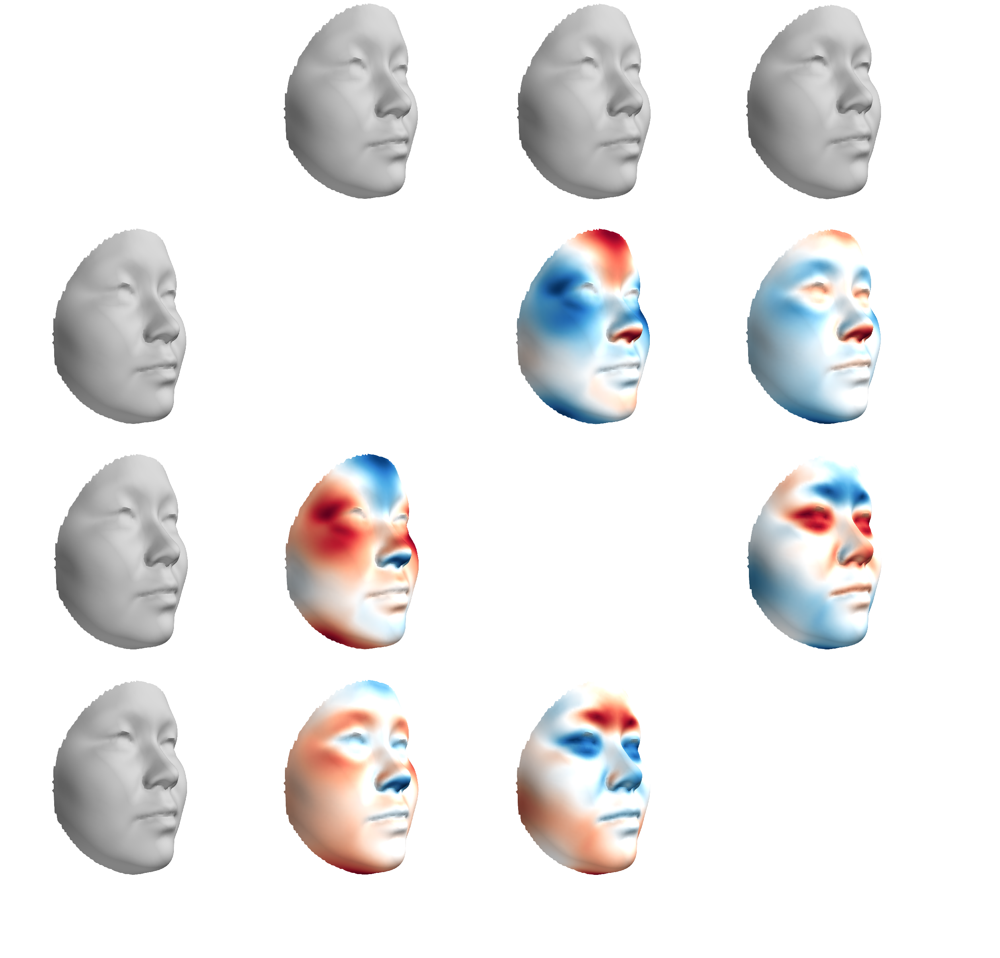

In [9]:
#Plot set of faces
nrow = landmark_sex_avg.shape[0]
fig = plt.figure(figsize=(10, 10), dpi=300)
ax  = fig.add_subplot(111)
ax.set_ylim([0,1])
ax.set_xlim([0,1])
plt.axis('off')

crow = 0.85
#Plot sex dimorphism

face1 = FaceShape(landmark_sex_avg[0], facets)
face2 = FaceShape(landmark_sex_avg[2], facets)
face3 = FaceShape(landmark_sex_avg[4], facets)

img1 = face1.take_screenshot(profile=1)
img2 = face2.take_screenshot(profile=1)
img3 = face3.take_screenshot(profile=1)

nor_disp1_2 = face1.get_normal_displacement(face2)
nor_disp1_3 = face1.get_normal_displacement(face3)
nor_disp2_1 = face2.get_normal_displacement(face1)
nor_disp2_3 = face2.get_normal_displacement(face3)
nor_disp3_1 = face3.get_normal_displacement(face1)
nor_disp3_2 = face3.get_normal_displacement(face2)

avg1_2 = FaceShape((face1.landmarks + face2.landmarks) / 2, facets)
avg1_3 = FaceShape((face1.landmarks + face3.landmarks) / 2, facets)
avg2_3 = FaceShape((face2.landmarks + face3.landmarks) / 2, facets)

img4 = avg1_2.take_screenshot(colormap=nor_disp1_2, profile=1, colortype='RdBu')
img5 = avg1_3.take_screenshot(colormap=nor_disp1_3, profile=1, colortype='RdBu')
img6 = avg2_3.take_screenshot(colormap=nor_disp2_3, profile=1, colortype='RdBu')
img7 = avg1_2.take_screenshot(colormap=nor_disp2_1, profile=1, colortype='RdBu')
img8 = avg1_3.take_screenshot(colormap=nor_disp3_1, profile=1, colortype='RdBu')
img9 = avg2_3.take_screenshot(colormap=nor_disp3_2, profile=1, colortype='RdBu')

image1 = OffsetImage(img1, zoom=0.1)
image2 = OffsetImage(img2, zoom=0.1)
image3 = OffsetImage(img3, zoom=0.1)
image4 = OffsetImage(img4, zoom=0.1)
image5 = OffsetImage(img5, zoom=0.1)
image6 = OffsetImage(img6, zoom=0.1)
image7 = OffsetImage(img7, zoom=0.1)
image8 = OffsetImage(img8, zoom=0.1)
image9 = OffsetImage(img9, zoom=0.1)
    
a1 = AnnotationBbox(image1, (0.10, 0.65), xycoords='data', frameon=False)
a2 = AnnotationBbox(image2, (0.10, 0.40), xycoords='data', frameon=False)
a3 = AnnotationBbox(image3, (0.10, 0.15), xycoords='data', frameon=False)

a12 = AnnotationBbox(image1, (0.35, 0.90), xycoords='data', frameon=False)
a22 = AnnotationBbox(image2, (0.60, 0.90), xycoords='data', frameon=False)
a32 = AnnotationBbox(image3, (0.85, 0.90), xycoords='data', frameon=False)

a4 = AnnotationBbox(image4, (0.60, 0.65), xycoords='data', frameon=False)
a5 = AnnotationBbox(image5, (0.85, 0.65), xycoords='data', frameon=False)
a6 = AnnotationBbox(image6, (0.85, 0.40), xycoords='data', frameon=False)

a7 = AnnotationBbox(image7, (0.35, 0.40), xycoords='data', frameon=False)
a8 = AnnotationBbox(image8, (0.35, 0.15), xycoords='data', frameon=False)
a9 = AnnotationBbox(image9, (0.60, 0.15), xycoords='data', frameon=False)
    
ax.add_artist(a1)
ax.add_artist(a2)
ax.add_artist(a3)

ax.add_artist(a12)
ax.add_artist(a22)
ax.add_artist(a32)

ax.add_artist(a4)
ax.add_artist(a5)
ax.add_artist(a6)
ax.add_artist(a7)
ax.add_artist(a8)
ax.add_artist(a9)

os.chdir(pathfig)
plt.savefig('Figure6.png', dpi=300, bbox_inches='tight')
plt.show()